In [1]:
!pip install opendatasets -q

In [2]:
!pip install dlib

In [30]:
# Library untuk manipulasi data dan analisis numerik
import pandas as pd         # Untuk bekerja dengan data tabular (DataFrame)
import numpy as np          # Untuk operasi numerik dan manipulasi array

# Library untuk plotting dan visualisasi data
import matplotlib.pyplot as plt  # Untuk pembuatan grafik dan plot dasar
import seaborn as sns        # Untuk visualisasi statistik yang lebih menarik

# Library untuk pengolahan dan manipulasi gambar
import cv2                   # Untuk pemrosesan gambar tingkat lanjut
from PIL import Image        # Untuk manipulasi gambar sederhana

# Library untuk operasi sistem, file, dan direktori
import os                    # Untuk operasi sistem dan manajemen file/direktori
import shutil                # Untuk operasi manipulasi file dan direktori
import zipfile               # Untuk handling file zip
import random                # Untuk generasi bilangan acak
from uuid import uuid4       # Untuk membuat identifier unik

# Library untuk augmentasi dan preprocessing gambar pada deep learning dengan Keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Library untuk progress bar saat iterasi panjang
from tqdm import tqdm

# Library untuk data loading
import opendatasets as od    # Untuk mengunduh dataset dari sumber online

# Library untuk deteksi wajah dan pengunduhan file terkait
import dlib                  # Untuk deteksi wajah
import urllib.request        # Untuk mengunduh file dari URL
import bz2                   # Untuk dekompresi file bz2

# Library untuk mengabaikan peringatan agar output lebih bersih
import warnings
warnings.filterwarnings('ignore')

# Library untuk upload file (khusus Google Colab)
from google.colab import files

# **Loading Dataset**

In [4]:
kaggle = {"username":"samsulpoetry","key":"7b6651928aa74134cc42ea304f4eb389"}

In [5]:
od.download('https://www.kaggle.com/datasets/niten19/face-shape-dataset')

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: samsulpoetry
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/niten19/face-shape-dataset


100%|██████████| 639M/639M [00:03<00:00, 185MB/s] 


In [6]:
# Tentukan path ke dataset yang diunduh
dataset_path = '/content/face-shape-dataset/FaceShape Dataset/'
train_path = os.path.join(dataset_path, 'training_set')
test_path = os.path.join(dataset_path, 'testing_set')
output_path = 'face-shape-hijabist'

# Buat folder output jika belum ada
if not os.path.exists(output_path):
    os.makedirs(output_path)

# Fungsi untuk menyalin file dari sumber ke tujuan
def copy_files(src_dir, dest_dir):
    for root, _, files in os.walk(src_dir):
        for file in files:
            if file.lower() == 'desktop.ini': # Tambahkan pengecekan ini
                continue # Lewati file desktop.ini
            src_file = os.path.join(root, file)
            # Buat struktur direktori yang sama di folder output
            relative_path = os.path.relpath(src_file, src_dir)
            dest_file = os.path.join(dest_dir, relative_path)
            # Pastikan direktori tujuan ada
            os.makedirs(os.path.dirname(dest_file), exist_ok=True)
            # Salin file
            shutil.copy2(src_file, dest_file)

# Salin file dari folder training
print(f"Menyalin file dari: {train_path}")
copy_files(train_path, output_path)
print("Selesai menyalin file training.")

# Salin file dari folder testing
print(f"Menyalin file dari: {test_path}")
copy_files(test_path, output_path)
print("Selesai menyalin file testing.")

print(f"Dataset gabungan disimpan di: {output_path}")

Menyalin file dari: /content/face-shape-dataset/FaceShape Dataset/training_set
Selesai menyalin file training.
Menyalin file dari: /content/face-shape-dataset/FaceShape Dataset/testing_set
Selesai menyalin file testing.
Dataset gabungan disimpan di: face-shape-hijabist


# **Exploratory Data Analysis (EDA)**

In [7]:
# Cek isi folder
datasets = './face-shape-hijabist'
print("\nIsi dalam dataset:")
print(os.listdir(datasets))


Isi dalam dataset:
['Oval', 'Oblong', 'Heart', 'Square', 'Round']


Distribusi jumlah gambar per kelas: {'Oval': 1000, 'Oblong': 1000, 'Heart': 1000, 'Square': 1000, 'Round': 1000}


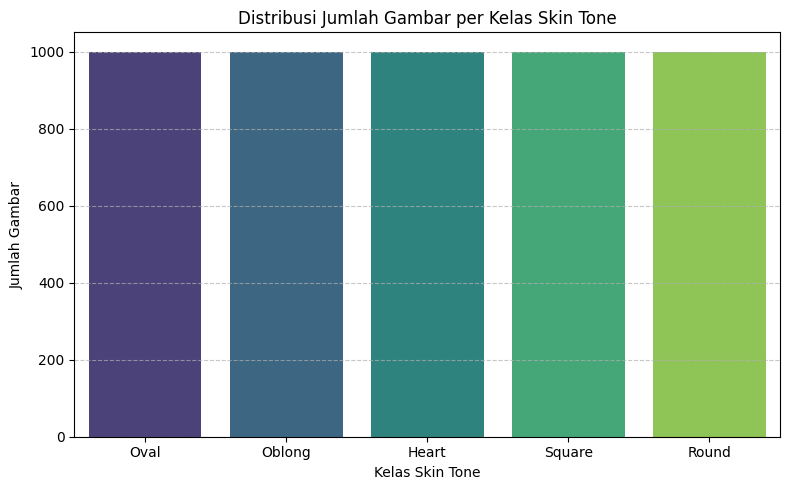

In [31]:
def count_images_per_class(dataset_path):
    """
    Mengembalikan dictionary jumlah gambar (.jpg/.png/.jpeg) per kelas dari dataset.
    """
    return {
        class_name: len([
            f for f in os.listdir(os.path.join(dataset_path, class_name))
            if os.path.isfile(os.path.join(dataset_path, class_name, f)) and
               f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ])
        for class_name in os.listdir(dataset_path)
        if os.path.isdir(os.path.join(dataset_path, class_name))
    }

# Hitung jumlah gambar per kelas
class_counts = count_images_per_class(datasets)

# Cetak hasil
print("Distribusi jumlah gambar per kelas:", class_counts)

# Visualisasi distribusi kelas
plt.figure(figsize=(8, 5))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette='viridis')
plt.title('Distribusi Jumlah Gambar per Kelas Skin Tone')
plt.xlabel('Kelas Skin Tone')
plt.ylabel('Jumlah Gambar')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

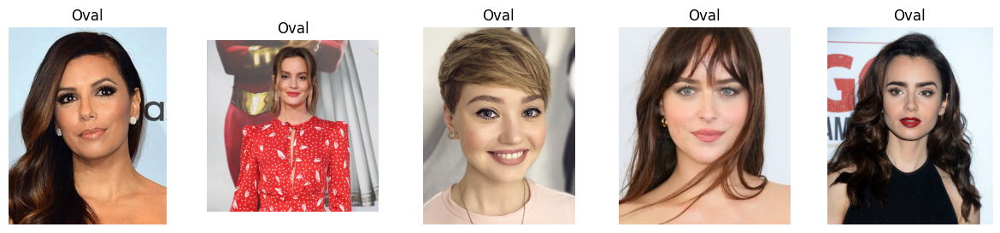

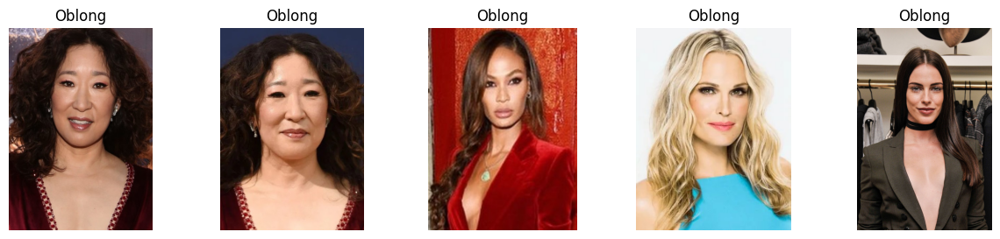

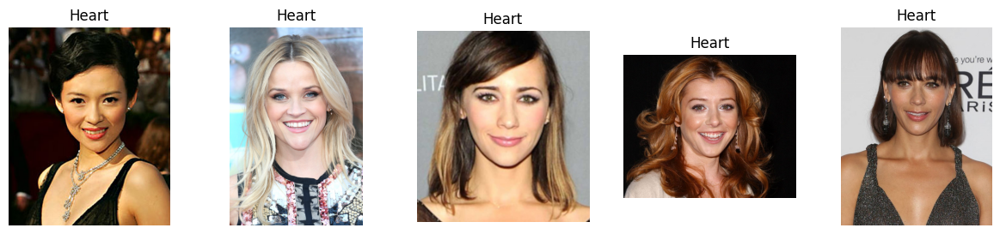

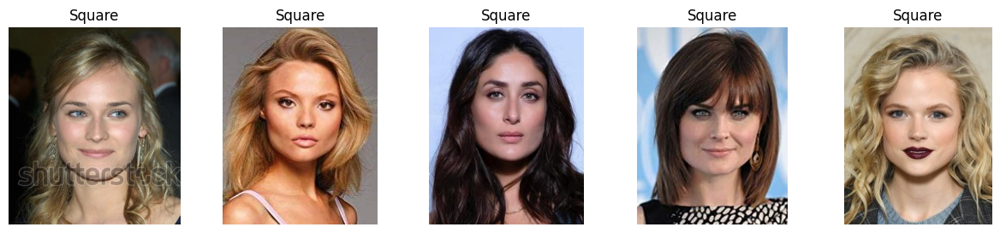

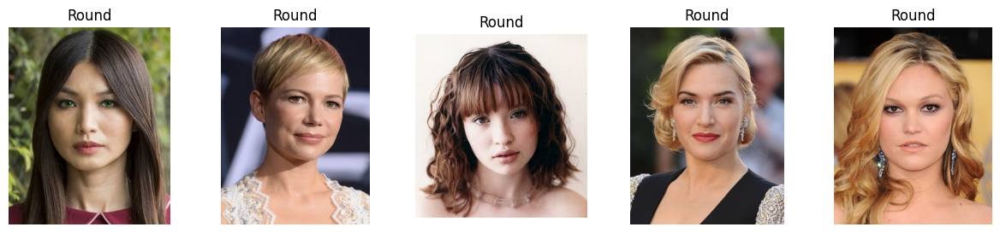

In [9]:
#Visualisasi gambar di setiap kelasnya
def show_samples(datasets, class_name, n=5):
    folder = os.path.join(datasets, class_name)
    images = os.listdir(folder)[:n]
    plt.figure(figsize=(15, 3))
    for i, img_file in enumerate(images):
        img_path = os.path.join(folder, img_file)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, n, i+1)
        plt.imshow(img)
        plt.title(class_name)
        plt.axis('off')
    plt.show()

for skin_class in os.listdir(datasets):
    show_samples(datasets, skin_class)

In [10]:
def check_image_sizes(dataset_path):
    """
    Mengumpulkan ukuran (width, height) semua gambar dalam dataset dan menampilkan statistik deskriptif.
    """
    sizes = []
    for skin_class in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, skin_class)
        if not os.path.isdir(class_path):
            continue

        for file in os.listdir(class_path):
            img_path = os.path.join(class_path, file)
            try:
                with Image.open(img_path) as img:
                    sizes.append(img.size)
            except Exception as e:
                print(f"Error membuka gambar {img_path}: {e}")

    sizes_df = pd.DataFrame(sizes, columns=['Width', 'Height'])
    print(sizes_df.describe())
    return sizes_df

# Cek Ukuran Gambar
sizes_df = check_image_sizes(datasets)

             Width      Height
count  5000.000000  5000.00000
mean    573.766200   736.24080
std     422.799825   560.73446
min     101.000000   131.00000
25%     307.000000   400.00000
50%     450.000000   578.00000
75%     682.000000   866.50000
max    6659.000000  9999.00000


Insight:
1. Ukuran gambar perlu di resize dan disamakan ke 224*224 agar cocok ke pretrained model
2. Gambar masih dipengaruhi bagian wajah lain, background dan komponen yang tidak sesuai untuk klasifikasi face shape maka perlu di cropping agar fokus di bagian dagu dan garis rahang saja.
3. distribusi data masih sudah seimbang. Namun, augmentasi tetap diperlukan untuk setiap kelas untuk robustness model

# **Data Preparation**



## **Cropping Image**

In [11]:
url = 'http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2'
bz2_path = 'shape_predictor_68_face_landmarks.dat.bz2'
dat_path = 'shape_predictor_68_face_landmarks.dat'

# Download jika belum ada
if not os.path.exists(dat_path):
    print("Downloading predictor...")
    urllib.request.urlretrieve(url, bz2_path)

    print("Extracting predictor...")
    with bz2.BZ2File(bz2_path) as fr, open(dat_path, 'wb') as fw:
        fw.write(fr.read())

    os.remove(bz2_path)
    print("Done.")
else:
    print("Predictor file already exists.")

Extracting predictor...
Done.


In [12]:
def crop_facial_features(source_dir, output_dir, predictor_path):
    """
    Crop facial features using HOG face detector with CLAHE preprocessing.
    """
    detector = dlib.get_frontal_face_detector()
    predictor = dlib.shape_predictor(predictor_path)

    total_processed = 0
    total_cropped_successfully = 0
    failed_to_detect = []
    other_errors = []

    os.makedirs(output_dir, exist_ok=True)

    for class_name in os.listdir(source_dir):
        class_input_path = os.path.join(source_dir, class_name)
        class_output_path = os.path.join(output_dir, class_name)

        if not os.path.isdir(class_input_path):
            continue

        os.makedirs(class_output_path, exist_ok=True)

        image_files = [f for f in os.listdir(class_input_path)
                       if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        print(f"\nProcessing class: {class_name}")
        for img_name in tqdm(image_files, desc=f"Cropping {class_name}"):
            input_path = os.path.join(class_input_path, img_name)
            output_img_path = os.path.join(class_output_path, img_name)

            total_processed += 1

            try:
                img = cv2.imread(input_path)
                if img is None:
                    other_errors.append(f"{img_name} (Image not readable)")
                    shutil.copy2(input_path, output_img_path)
                    continue

                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
                enhanced_gray = clahe.apply(gray)

                upsampling_level = 1
                faces = detector(enhanced_gray, upsampling_level)

                if not faces:
                    failed_to_detect.append(img_name)
                    shutil.copy2(input_path, output_img_path)
                    continue

                face = faces[0]
                landmarks = predictor(enhanced_gray, face)
                points = np.array([(landmarks.part(i).x, landmarks.part(i).y) for i in range(68)])

                # Gunakan landmark wajah untuk menentukan batas wajah dan dahi
                jaw = points[0:17]
                chin = points[8]
                nose_bridge_top = points[27]
                left_eyebrow_outer = points[17]
                right_eyebrow_outer = points[26]

                # Estimasi dahi dari hidung
                face_height_to_nose = chin[1] - nose_bridge_top[1]
                if face_height_to_nose <= 0:
                    face_height_to_nose = 1
                forehead_height_estimate = int(abs(face_height_to_nose) * 0.6)
                forehead_top_y = max(0, nose_bridge_top[1] - forehead_height_estimate)

                padding = 15
                x1 = min(jaw[:, 0].min(), left_eyebrow_outer[0]) - padding
                x2 = max(jaw[:, 0].max(), right_eyebrow_outer[0]) + padding
                y1 = forehead_top_y - padding
                y2 = chin[1] + padding

                # Buat crop menjadi persegi dan terpusat
                width = x2 - x1
                height = y2 - y1
                side = max(width, height)
                center_x = (x1 + x2) // 2
                center_y = (y1 + y2) // 2

                x1 = max(0, center_x - side // 2)
                x2 = min(img.shape[1], center_x + side // 2)
                y1 = max(0, center_y - side // 2)
                y2 = min(img.shape[0], center_y + side // 2)

                if x1 >= x2 or y1 >= y2:
                    other_errors.append(f"{img_name} (Invalid square crop dimensions)")
                    shutil.copy2(input_path, output_img_path)
                    continue

                cropped_bgr = img[y1:y2, x1:x2]
                if cropped_bgr.size == 0:
                    other_errors.append(f"{img_name} (Empty cropped image)")
                    shutil.copy2(input_path, output_img_path)
                    continue

                Image.fromarray(cv2.cvtColor(cropped_bgr, cv2.COLOR_BGR2RGB)).save(output_img_path)
                total_cropped_successfully += 1

            except Exception as e:
                other_errors.append(f"{img_name} ({str(e)})")
                shutil.copy2(input_path, output_img_path)

    # Simpan daftar gambar gagal deteksi dan error lainnya
    with open(os.path.join(output_dir, "failed_to_detect.txt"), "w") as f:
        f.write("\n".join(failed_to_detect))
    with open(os.path.join(output_dir, "other_errors.txt"), "w") as f:
        f.write("\n".join(other_errors))

    print(f"\n--- Cropping Summary (HOG + CLAHE, Square Box) ---")
    print(f"Total images processed: {total_processed}")
    print(f"Successfully cropped: {total_cropped_successfully}")
    print(f"Failed to detect face in: {len(failed_to_detect)} images")
    print(f"Other errors: {len(other_errors)} images")

In [13]:
crop_facial_features(
    source_dir='/content/face-shape-hijabist',
    output_dir='./face-cropped-hijabist',
    predictor_path='shape_predictor_68_face_landmarks.dat'
)


Processing class: Oval


Cropping Oval: 100%|██████████| 1000/1000 [06:24<00:00,  2.60it/s]



Processing class: Oblong


Cropping Oblong: 100%|██████████| 1000/1000 [06:20<00:00,  2.63it/s]



Processing class: Heart


Cropping Heart: 100%|██████████| 1000/1000 [06:05<00:00,  2.74it/s]



Processing class: Square


Cropping Square: 100%|██████████| 1000/1000 [05:32<00:00,  3.01it/s]



Processing class: Round


Cropping Round: 100%|██████████| 1000/1000 [06:04<00:00,  2.74it/s]


--- Cropping Summary (HOG + CLAHE, Square Box) ---
Total images processed: 5000
Successfully cropped: 4988
Failed to detect face in: 11 images
Other errors: 1 images


In [17]:
datasets_new = '/content/face-cropped-hijabist'

<Figure size 1500x300 with 0 Axes>

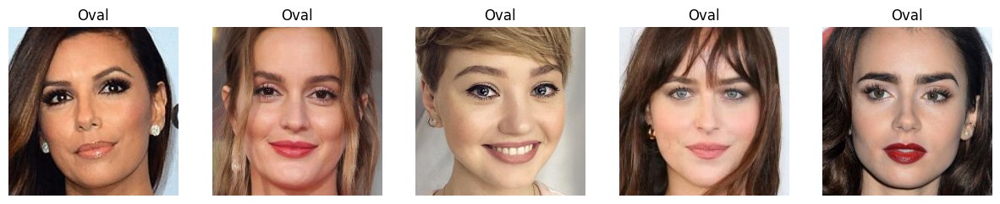

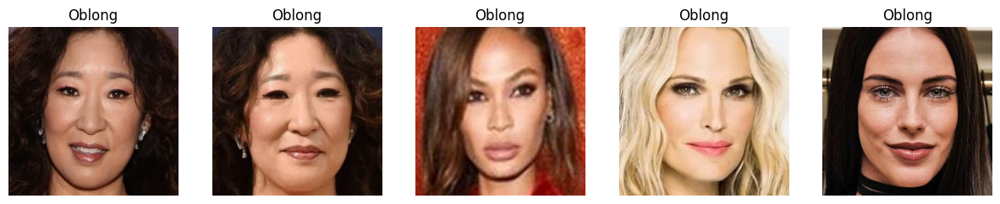

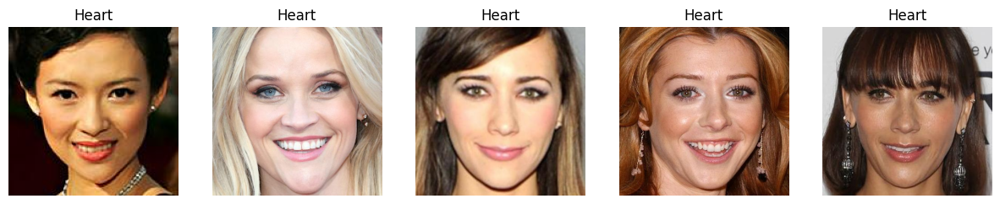

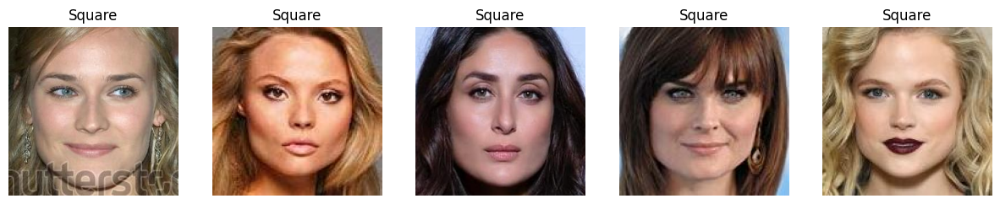

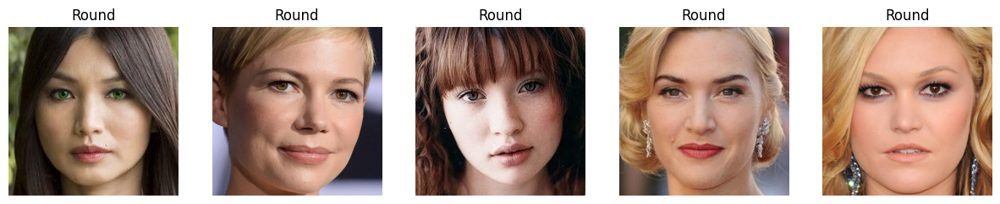

In [18]:
for skin_class in os.listdir(datasets_new):
    show_samples(datasets_new, skin_class)

In [19]:
class_counts = count_images_per_class(datasets_new)

# Cetak hasil
print("Distribusi jumlah gambar per kelas:", class_counts)

Distribusi jumlah gambar per kelas: {'.ipynb_checkpoints': 0, 'Oval': 999, 'Oblong': 999, 'Heart': 999, 'Square': 999, 'Round': 992}


## **Resize Image**

In [20]:
def resize_with_padding(img, target_size=(224, 224), bg_color=(0, 0, 0)):
    """
    Resize gambar dengan mempertahankan rasio aspek dan menambahkan padding.
    """
    original_size = img.size  # (width, height)
    ratio = min(target_size[0] / original_size[0], target_size[1] / original_size[1])
    new_size = (int(original_size[0] * ratio), int(original_size[1] * ratio))
    img = img.resize(new_size, Image.Resampling.LANCZOS)

    new_img = Image.new("RGB", target_size, bg_color)
    paste_position = ((target_size[0] - new_size[0]) // 2,
                      (target_size[1] - new_size[1]) // 2)
    new_img.paste(img, paste_position)
    return new_img

def resize_images(source_dir, output_dir, target_size=(224, 224)):
    """
    Resize semua gambar dari source_dir ke ukuran target dengan padding dan simpan ke output_dir
    dengan struktur folder kelas yang sama.
    """
    print(f"\nResizing images from {source_dir} to {target_size} with padding and saving to {output_dir}...")
    total_resized = 0
    errored_files = []

    os.makedirs(output_dir, exist_ok=True)

    for class_name in os.listdir(source_dir):
        class_source_path = os.path.join(source_dir, class_name)
        class_output_path = os.path.join(output_dir, class_name)

        if not os.path.isdir(class_source_path):
            continue

        os.makedirs(class_output_path, exist_ok=True)

        print(f"  Processing class: {class_name}")
        image_files = [
            f for f in os.listdir(class_source_path)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ]

        for img_file in tqdm(image_files, desc=f"    Resizing {class_name}"):
            source_img_path = os.path.join(class_source_path, img_file)

            try:
                with Image.open(source_img_path) as img:
                    if img.mode != 'RGB':
                        img = img.convert('RGB')

                    # Resize dengan padding
                    img_resized = resize_with_padding(img, target_size)

                    # Simpan ke folder output baru
                    output_img_path_jpg = os.path.splitext(os.path.join(class_output_path, img_file))[0] + ".jpg"
                    img_resized.save(output_img_path_jpg, format='JPEG', quality=95)

                    total_resized += 1

            except Exception as e:
                print(f"    Error resizing {source_img_path}: {e}")
                errored_files.append(source_img_path)

    print("\nImage resizing complete.")
    print(f"Total images resized: {total_resized}")
    if errored_files:
        print(f"Files with errors during resizing ({len(errored_files)}):")
        for f in errored_files:
            print(f"  - {f}")

In [21]:
resized_dataset = "./dataset-face-shape_resized"

# Jalankan fungsi resize
resize_images(datasets_new, resized_dataset, target_size=(224, 224))


Resizing images from /content/face-cropped-hijabist to (224, 224) with padding and saving to ./dataset-face-shape_resized...
  Processing class: .ipynb_checkpoints


    Resizing .ipynb_checkpoints: 0it [00:00, ?it/s]


  Processing class: Oval


    Resizing Oval: 100%|██████████| 999/999 [00:07<00:00, 130.53it/s]


  Processing class: Oblong


    Resizing Oblong: 100%|██████████| 999/999 [00:07<00:00, 140.54it/s]


  Processing class: Heart


    Resizing Heart: 100%|██████████| 999/999 [00:07<00:00, 130.74it/s]


  Processing class: Square


    Resizing Square: 100%|██████████| 999/999 [00:06<00:00, 146.86it/s]


  Processing class: Round


    Resizing Round: 100%|██████████| 992/992 [00:07<00:00, 124.89it/s]


Image resizing complete.
Total images resized: 4988


<Figure size 1500x300 with 0 Axes>

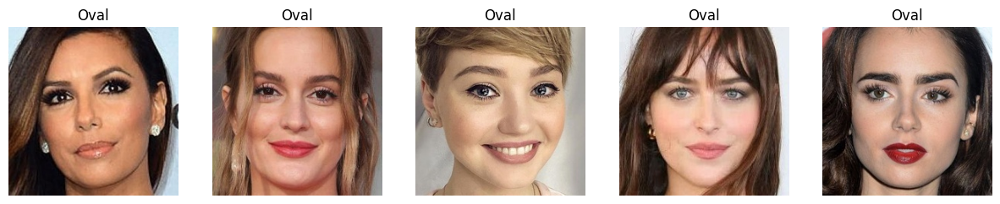

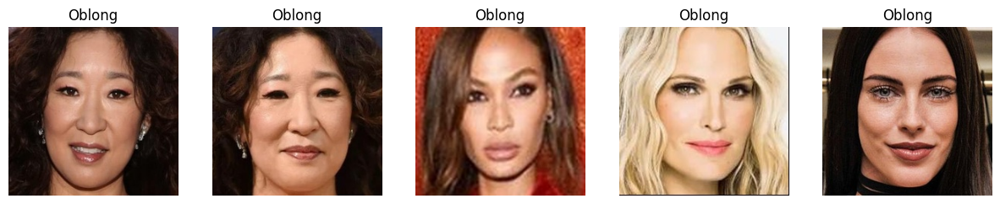

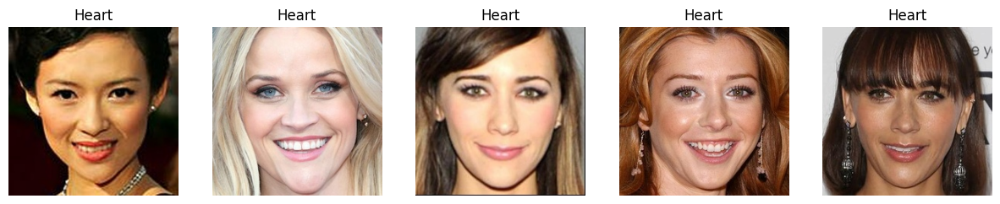

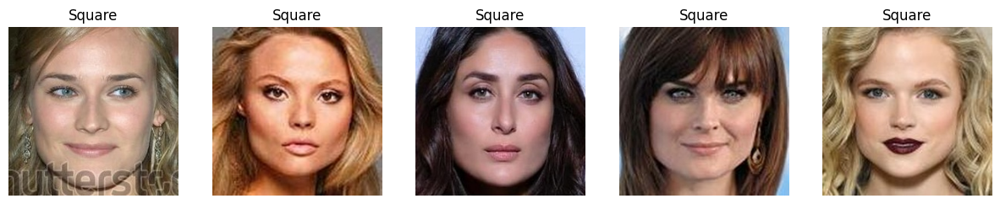

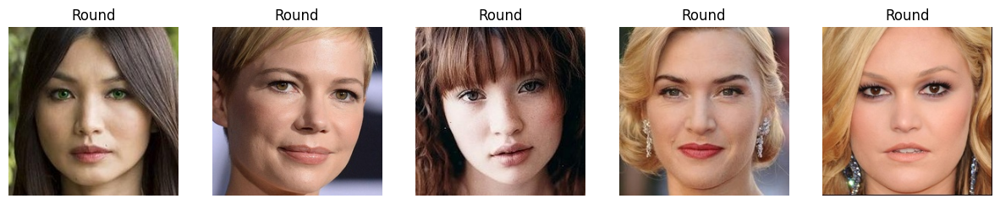

In [22]:
for skin_class in os.listdir(resized_dataset):
    show_samples(resized_dataset, skin_class)

In [23]:
# Cek Ukuran Gambar
sizes_df = check_image_sizes(resized_dataset)

        Width  Height
count  4988.0  4988.0
mean    224.0   224.0
std       0.0     0.0
min     224.0   224.0
25%     224.0   224.0
50%     224.0   224.0
75%     224.0   224.0
max     224.0   224.0


# **Data Splitting**

In [24]:
def split_dataset(source_dir, dest_dir, train_ratio=0.8):
    """
    Memisahkan dataset ke dalam folder 'train' dan 'val' dengan rasio tertentu
    menggunakan progress bar tqdm.
    """
    print(
        f"\nMembagi dataset dari {source_dir} ke dalam train/val "
        f"dengan rasio {int(train_ratio * 100)}/{int((1 - train_ratio) * 100)}..."
    )

    classes = [
        d for d in os.listdir(source_dir)
        if os.path.isdir(os.path.join(source_dir, d))
    ]

    # Buat folder tujuan untuk setiap split dan kelas
    for split in ('train', 'val'):
        for cls in classes:
            os.makedirs(os.path.join(dest_dir, split, cls), exist_ok=True)

    # Proses per kelas secara stratified dengan tqdm
    for cls in classes:
        class_path = os.path.join(source_dir, cls)
        all_images = [
            f for f in os.listdir(class_path)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ]
        random.shuffle(all_images)

        split_index = int(len(all_images) * train_ratio)
        train_images = all_images[:split_index]
        val_images = all_images[split_index:]

        # Salin file sesuai pembagian dengan tqdm
        for split_name, images in [('train', train_images), ('val', val_images)]:
            print(f"  Processing class: {cls} ({split_name})")
            for img_name in tqdm(images, desc=f"    Copying {split_name} {cls}"):
                src = os.path.join(class_path, img_name)
                dst = os.path.join(dest_dir, split_name, cls, img_name)
                shutil.copy2(src, dst)

    print("\nPembagian dataset selesai.")

def count_images_in_folder(base_dir, split):
    """
    Menghitung jumlah gambar dalam folder 'train' dan 'val'.
    """
    path = os.path.join(base_dir, split)
    if not os.path.exists(path):
        print(f"Folder '{path}' tidak ditemukan.")
        return

    print(f"\nJumlah data di folder {split}:")
    for cls in os.listdir(path):
        cls_path = os.path.join(path, cls)
        if os.path.isdir(cls_path):
            count = len([
                f for f in os.listdir(cls_path)
                if f.lower().endswith(('.png', '.jpg', '.jpeg'))
            ])
            print(f"  - {cls}: {count} gambar")

In [25]:
split_dataset_path = './dataset-face-shape_split'

split_dataset(resized_dataset, split_dataset_path, train_ratio=0.8)

count_images_in_folder(split_dataset_path, 'train')
count_images_in_folder(split_dataset_path, 'val')


Membagi dataset dari ./dataset-face-shape_resized ke dalam train/val dengan rasio 80/19...
  Processing class: .ipynb_checkpoints (train)


    Copying train .ipynb_checkpoints: 0it [00:00, ?it/s]


  Processing class: .ipynb_checkpoints (val)


    Copying val .ipynb_checkpoints: 0it [00:00, ?it/s]


  Processing class: Oval (train)


    Copying train Oval: 100%|██████████| 799/799 [00:00<00:00, 7160.50it/s]


  Processing class: Oval (val)


    Copying val Oval: 100%|██████████| 200/200 [00:00<00:00, 6959.48it/s]


  Processing class: Oblong (train)


    Copying train Oblong: 100%|██████████| 799/799 [00:00<00:00, 6032.60it/s]


  Processing class: Oblong (val)


    Copying val Oblong: 100%|██████████| 200/200 [00:00<00:00, 6809.16it/s]


  Processing class: Heart (train)


    Copying train Heart: 100%|██████████| 799/799 [00:00<00:00, 6542.75it/s]


  Processing class: Heart (val)


    Copying val Heart: 100%|██████████| 200/200 [00:00<00:00, 5764.38it/s]


  Processing class: Square (train)


    Copying train Square: 100%|██████████| 799/799 [00:00<00:00, 4801.91it/s]


  Processing class: Square (val)


    Copying val Square: 100%|██████████| 200/200 [00:00<00:00, 5502.42it/s]


  Processing class: Round (train)


    Copying train Round: 100%|██████████| 793/793 [00:00<00:00, 3833.66it/s]


  Processing class: Round (val)


    Copying val Round: 100%|██████████| 199/199 [00:00<00:00, 3225.38it/s]


Pembagian dataset selesai.

Jumlah data di folder train:
  - .ipynb_checkpoints: 0 gambar
  - Oval: 799 gambar
  - Oblong: 799 gambar
  - Heart: 799 gambar
  - Square: 799 gambar
  - Round: 793 gambar

Jumlah data di folder val:
  - .ipynb_checkpoints: 0 gambar
  - Oval: 200 gambar
  - Oblong: 200 gambar
  - Heart: 200 gambar
  - Square: 200 gambar
  - Round: 199 gambar


## **Augmentasi Data Training**

In [27]:
def augment_images(train_dir, target_count):
    """
    Melakukan augmentasi gambar di folder train_dir agar setiap kelas memiliki
    jumlah gambar setidaknya sebanyak target_count.
    """

    # Konfigurasi ImageDataGenerator untuk augmentasi gambar.
    augmentor = ImageDataGenerator(
        rotation_range=15,             # Rotasi
        brightness_range=(0.8, 1.2),   # Variasi pencahayaan
        fill_mode='nearest',           # Hindari padding aneh
        horizontal_flip=True           # Balik horizontal
    )

    # Loop untuk setiap folder kelas di direktori pelatihan
    for class_name in os.listdir(train_dir):
        class_path = os.path.join(train_dir, class_name)
        if not os.path.isdir(class_path):
            continue  # Lewati jika bukan direktori (misalnya file README)

        # Ambil daftar gambar asli (tanpa 'aug' di nama file) di kelas ini
        images = [
            f for f in os.listdir(class_path)
            if f.lower().endswith(('.jpg', '.jpeg', '.png')) and 'aug' not in f.lower()
        ]
        current_count = len(images)  # Jumlah gambar asli saat ini

        # Jika jumlah gambar sudah mencukupi, lewati augmentasi untuk kelas ini
        if current_count >= target_count:
            print(f"Kelas '{class_name}' sudah cukup: {current_count}/{target_count}")
            continue

        needed = target_count - current_count  # Jumlah gambar yang perlu ditambahkan
        # Hitung jumlah augmentasi yang dibutuhkan per gambar
        per_image_aug_count = needed // len(images) if len(images) > 0 else 0
        # Tambahkan 1 augmentasi ekstra untuk sisa jika ada
        if len(images) > 0 and needed % len(images) != 0:
             per_image_aug_count += 1

        augmented_count = 0  # Counter jumlah augmentasi yang telah dibuat

        print(f"\nAugmentasi kelas {class_name} ({needed} gambar dibutuhkan):")

        # Gunakan tqdm untuk melacak progress augmentasi untuk setiap kelas
        with tqdm(total=needed, desc=f"Augmenting {class_name}", unit="images") as pbar:
            # Loop setiap gambar asli dan lakukan augmentasi
            for img_name in images:
                if augmented_count >= needed:
                    break  # Stop jika augmentasi sudah cukup

                img_path = os.path.join(class_path, img_name)
                try:
                    # Buka gambar dan ubah ke array
                    img = Image.open(img_path).convert('RGB')
                    img_array = np.expand_dims(np.array(img), axis=0)

                    i = 0  # Counter untuk jumlah augmentasi dari gambar ini

                    # Lakukan augmentasi menggunakan flow generator
                    for batch in augmentor.flow(
                        img_array,
                        batch_size=1,
                        save_to_dir=None,      # Kita simpan secara manual
                        save_format='jpg'
                    ):
                        # Buat nama file unik menggunakan UUID pendek
                        unique_id = uuid4().hex[:8]
                        new_filename = f"aug_{class_name}_{unique_id}.jpg"
                        save_path = os.path.join(class_path, new_filename)

                        # Simpan hasil augmentasi
                        Image.fromarray(batch[0].astype(np.uint8)).save(save_path, format='JPEG', quality=95)

                        i += 1
                        augmented_count += 1
                        pbar.update(1) # Update progress bar

                        # Hentikan augmentasi dari gambar ini jika sudah cukup
                        if i >= per_image_aug_count or augmented_count >= needed:
                            break

                except Exception as e:
                    # Tangani error pada gambar yang rusak atau tidak bisa dibuka
                    print(f"\nError pada {img_path}: {str(e)[:50]}")
                    pbar.set_description(f"Augmenting {class_name} (Error on {os.path.basename(img_path)})")


    # Cek akhir jumlah gambar per kelas setelah augmentasi
    final_count = {
        class_name: len([
            f for f in os.listdir(os.path.join(train_dir, class_name))
            if f.lower().endswith(('.jpg', '.jpeg', '.png'))
        ])
        for class_name in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, class_name))
    }

    print("\nHasil akhir distribusi gambar:")
    for k, v in final_count.items():
        print(f"{k}: {v} gambar")

In [28]:
train_dir = '/content/dataset-face-shape_split/train'
augment_images(train_dir, target_count=1200)


Augmentasi kelas .ipynb_checkpoints (1200 gambar dibutuhkan):


Augmenting .ipynb_checkpoints:   0%|          | 0/1200 [00:00<?, ?images/s]



Augmentasi kelas Oval (401 gambar dibutuhkan):


Augmenting Oval: 100%|██████████| 401/401 [00:07<00:00, 52.21images/s]



Augmentasi kelas Oblong (401 gambar dibutuhkan):


Augmenting Oblong: 100%|██████████| 401/401 [00:06<00:00, 62.95images/s]



Augmentasi kelas Heart (401 gambar dibutuhkan):


Augmenting Heart: 100%|██████████| 401/401 [00:07<00:00, 52.95images/s]



Augmentasi kelas Square (401 gambar dibutuhkan):


Augmenting Square: 100%|██████████| 401/401 [00:06<00:00, 64.93images/s]



Augmentasi kelas Round (407 gambar dibutuhkan):


Augmenting Round: 100%|██████████| 407/407 [00:07<00:00, 54.02images/s]


Hasil akhir distribusi gambar:
.ipynb_checkpoints: 0 gambar
Oval: 1200 gambar
Oblong: 1200 gambar
Heart: 1200 gambar
Square: 1200 gambar
Round: 1200 gambar


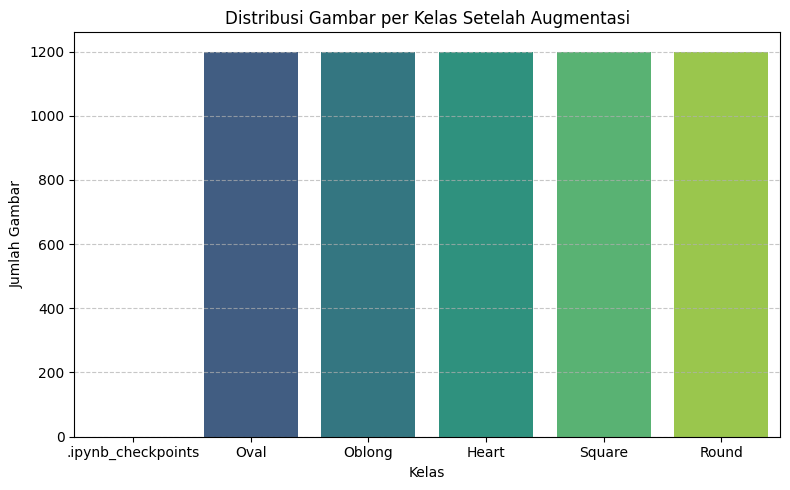

In [32]:
def plot_class_distribution(train_dir):
    """Hitung dan visualisasikan distribusi jumlah gambar per kelas"""
    final_count = {}
    classes = [d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))]

    for class_name in classes:
        class_path = os.path.join(train_dir, class_name)
        count = len([f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        final_count[class_name] = count

    plt.figure(figsize=(8, 5))
    sns.barplot(x=list(final_count.keys()), y=list(final_count.values()), palette='viridis')
    plt.title('Distribusi Gambar per Kelas Setelah Augmentasi')
    plt.xlabel('Kelas')
    plt.ylabel('Jumlah Gambar')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Visualisasi distribusi data
plot_class_distribution(train_dir)

<Figure size 1500x300 with 0 Axes>

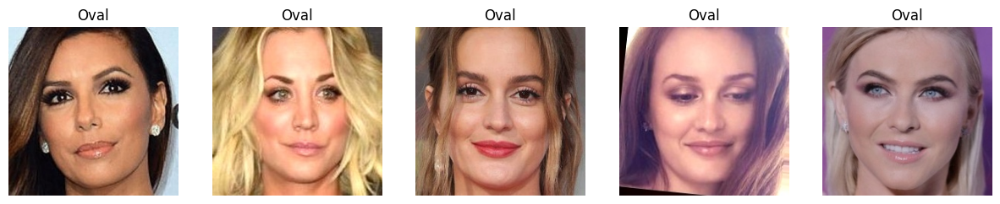

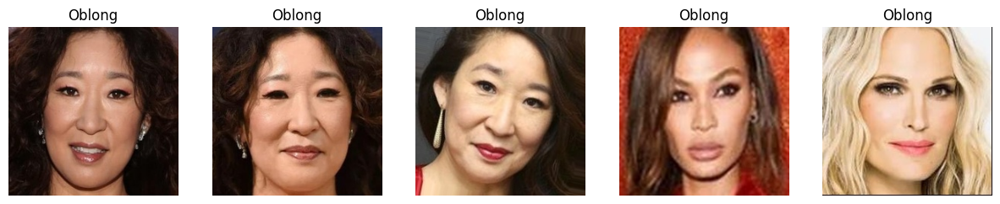

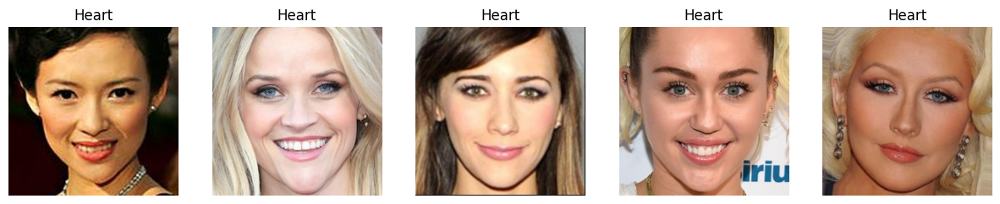

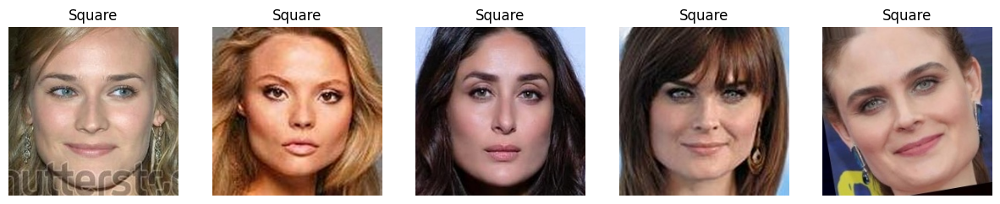

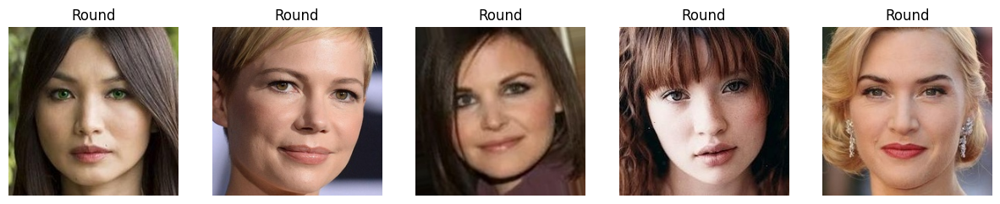

In [33]:
for skin_class in os.listdir(train_dir):
    show_samples(train_dir, skin_class)

In [34]:
!zip -r augmented-fs-hijabist.zip ./dataset-face-shape_split

files.download('augmented-fs-hijabist.zip')

Output streaming akan dipotong hingga 5000 baris terakhir.
  adding: dataset-face-shape_split/train/Oval/oval (775).jpg (deflated 1%)
  adding: dataset-face-shape_split/train/Oval/oval (82).jpg (deflated 1%)
  adding: dataset-face-shape_split/train/Oval/oval (31).jpg (deflated 1%)
  adding: dataset-face-shape_split/train/Oval/aug_Oval_a3aee82a.jpg (deflated 1%)
  adding: dataset-face-shape_split/train/Oval/oval (535).jpg (deflated 1%)
  adding: dataset-face-shape_split/train/Oval/oval (130).jpg (deflated 1%)
  adding: dataset-face-shape_split/train/Oval/oval (510).jpg (deflated 1%)
  adding: dataset-face-shape_split/train/Oval/aug_Oval_f6a1889d.jpg (deflated 1%)
  adding: dataset-face-shape_split/train/Oval/oval (892).jpg (deflated 1%)
  adding: dataset-face-shape_split/train/Oval/oval (624).jpg (deflated 1%)
  adding: dataset-face-shape_split/train/Oval/oval (642).jpg (deflated 1%)
  adding: dataset-face-shape_split/train/Oval/oval (965).jpg (deflated 1%)
  adding: dataset-face-shape_

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>